In [1]:
import argparse
import datetime
import math
import os
import sys
import random
import pickle
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from omegaconf import OmegaConf
sys.path.append('/data2/youngju/kimst24')

import torch
import torch.nn as nn
import torch.backends.cudnn as cudnn
from torchvision.utils import make_grid
import torchvision.transforms.functional as F
from torch.utils.data import DataLoader, Dataset, Subset, random_split
from torchvision import datasets, models, transforms
from tqdm.auto import tqdm
from utils.load_dataset import get_CUB_loaders
from utils.config_funcs import *
from utils.visualization import *

/home/youngju/anaconda3/envs/proto/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
parser = argparse.ArgumentParser()
parser.add_argument("--data-path", type=str, default="/data/CUB_200_2011/images")
parser.add_argument("--model-path", type=str, default="/data2/youngju/kimst24/outputs/clf_checkpoints/2024-04-27_132424/clf_ep-11_lr-0.001_val-acc-0.8609.pth")
parser.add_argument("--pickle-path", type=str, default="/data2/youngju/kimst24/outputs/get_config/train")
parser.add_argument("--q_pickle-path", type=str, default="/data2/youngju/kimst24/outputs/get_config/test")
parser.add_argument("--q_th", type=int, default=200)
parser.add_argument("--seed", type=int, default=0)
parser.add_argument("--batch-size", type=int, default=512)
parser.add_argument("--num-pickle", type=int, default=7)
parser.add_argument("--device", type=str, default="cuda:5")
parser.add_argument("--train-ratio", type=float, default=0.7)

args = parser.parse_args(args=[])

In [3]:
MEAN = np.array([0.485, 0.456, 0.406])
STD = np.array([0.229, 0.224, 0.225])
unorm = UnNormalize(mean=MEAN, std=STD)

random.seed(args.seed)
torch.manual_seed(args.seed)
cudnn.deterministic = True
cudnn.benchmark = False

(train_loader, train_data_len) = get_CUB_loaders(args.data_path, args.batch_size, args.train_ratio, train=True)
(val_loader, test_loader, valid_data_len, test_data_len) = get_CUB_loaders(args.data_path, int(args.batch_size/2), args.train_ratio, train=False)

In [4]:
model = models.resnet50(pretrained=False)
model.fc = nn.Linear(2048, 200)
model.load_state_dict(torch.load(args.model_path))
model = model.to(args.device)
model.eval()

/home/youngju/anaconda3/envs/proto/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/youngju/anaconda3/envs/proto/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [5]:
with open(f"{args.pickle_path}/total_activation.pkl","rb") as fr:
    ac_total = torch.sign(pickle.load(fr))
with open(f"{args.pickle_path}/total_activation.pkl","rb") as fr:
    h_total = pickle.load(fr)
with open(f"{args.pickle_path}/total_eq.pkl","rb") as fr:
    eq_total = pickle.load(fr)
with open(f"{args.pickle_path}/total_x.pkl","rb") as fr:
    x_total = pickle.load(fr)
with open(f"{args.pickle_path}/total_y.pkl","rb") as fr:
    y_total = pickle.load(fr)
with open(f"{args.pickle_path}/total_preds.pkl","rb") as fr:
    preds_total = pickle.load(fr)

In [6]:
ac_total.shape, eq_total.shape, x_total.shape, y_total.shape

(torch.Size([8251, 2048, 7, 7]),
 torch.Size([8251]),
 torch.Size([8251, 3, 224, 224]),
 torch.Size([8251]))

In [7]:
with open(f"{args.q_pickle_path}/total_activation.pkl","rb") as fr:
    q_ac_total = torch.sign(pickle.load(fr))
with open(f"{args.q_pickle_path}/total_activation.pkl","rb") as fr:
    q_h_total = pickle.load(fr)
with open(f"{args.q_pickle_path}/total_eq.pkl","rb") as fr:
    q_eq_total = pickle.load(fr)
with open(f"{args.q_pickle_path}/total_x.pkl","rb") as fr:
    q_x_total = pickle.load(fr)
with open(f"{args.q_pickle_path}/total_y.pkl","rb") as fr:
    q_y_total = pickle.load(fr)
with open(f"{args.q_pickle_path}/total_preds.pkl","rb") as fr:
    q_preds_total = pickle.load(fr)

In [8]:
q_ac_total.shape, q_eq_total.shape, q_x_total.shape, q_y_total.shape

(torch.Size([1769, 2048, 7, 7]),
 torch.Size([1769]),
 torch.Size([1769, 3, 224, 224]),
 torch.Size([1769]))

In [9]:
with open(f"{args.q_pickle_path}/q_euc_density_{args.q_th}.pkl","rb") as fr:
    q_density = pickle.load(fr)
with open(f"{args.q_pickle_path}/q_euc_n_nearest_y_{args.q_th}.pkl","rb") as fr:
    q_n_nearest_y = pickle.load(fr)

# Density 분포 확인

(array([667.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   2.,   0.,   0.,   0.,   0.,
          5.,   9.,  15.,  17.,  28.,  27.,  28.,  39.,  24.,  19.,  18.,
          6.,   4.,   2.,   2.,   8.,   7.,  14.,  12.,  11.,  15.,   9.,
         20.,  13.,  11.,  18.,  13.,  11.,   8.,   7.,  15.,  12.,  18.,
         19.,   7.,  10.,  15.,   8.,  10.,  18.,  14.,  19.,  15.,  10.,
          9.,  14.,  12.,  19.,  10.,  11.,  18.,  13.,  17.,  16.,  21.,
         15.,  24.,  14.,  19.,  10.,  16.,  17.,  11.,  13.,  19.,  27.,
          9.,  14.,  22.,  18.,  14.,  16.,   7.,   8.,  17.,  10.,   4.,
          5.]),
 array([    0.  ,   970.75,  1941.5 ,  2912.25,  3883.  ,  4853.75,
         5824.5 ,  6795.25,  7766.  ,  8736.75,  9707.5 , 10678.25,
        11649.  , 12619.75, 13590.5 , 14561.25, 15532.  , 16502.75,
        17473.5 , 18444.25, 19415.  , 20385.75, 21356.5 , 22327.25,
        23298.  , 24268.75, 25239.5 , 26210.25

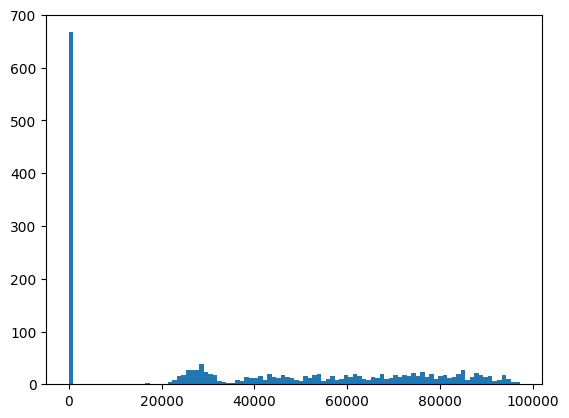

In [10]:
plt.hist(q_density, bins=100)

{'whiskers': [<matplotlib.lines.Line2D at 0x7f89880a8070>,
 'caps': [<matplotlib.lines.Line2D at 0x7f89880a85b0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f8988115d90>],
 'medians': [<matplotlib.lines.Line2D at 0x7f89880a8af0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f89880a8d90>],
 'means': []}

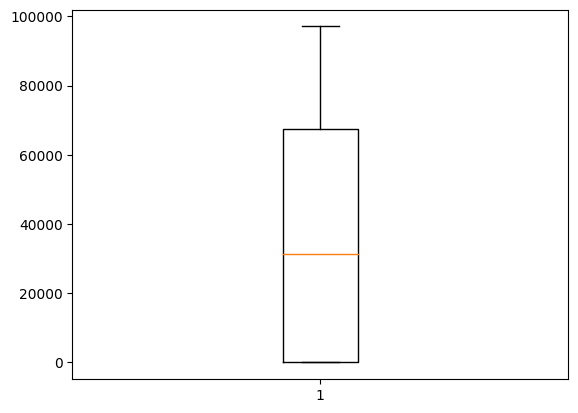

In [11]:
plt.boxplot(q_density)

Text(0.5, 0, 'Density of the regions')

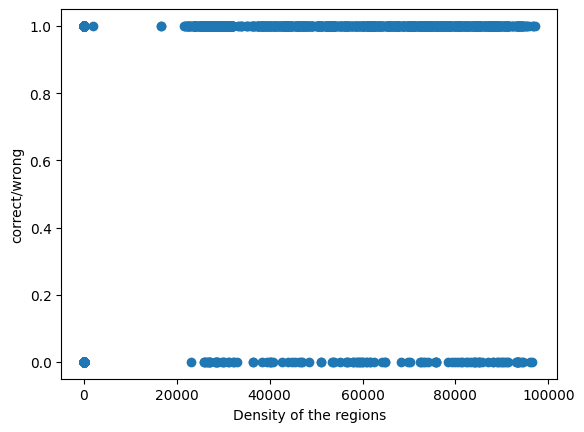

In [12]:
# density - eq
plt.scatter(q_density, q_eq_total.tolist())
plt.ylabel('correct/wrong')
plt.xlabel('Density of the regions')

In [13]:
import scipy.stats as stats
stats.spearmanr(q_density,q_eq_total.tolist())

SignificanceResult(statistic=0.07116142586223392, pvalue=0.002747201720439801)

Text(0.5, 0, 'Density of the regions')

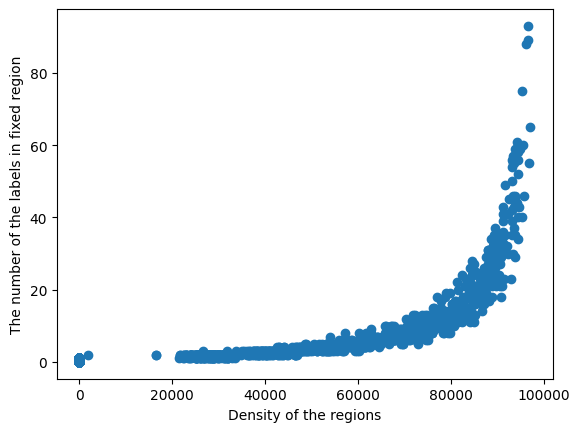

In [14]:
# density - the number of nearest y (label noise)
plt.scatter(q_density, q_n_nearest_y)
plt.ylabel('The number of the labels in fixed region')
plt.xlabel('Density of the regions')

# Low density region vs High density region

## Overall

In [15]:
num_zero = (np.array(q_density) == 0).sum()
num_zero

667

In [16]:
k = 32
low_density_idx = np.argsort(q_density)[:k].tolist()
high_density_idx = np.argsort(q_density)[-k:].tolist()

In [17]:
unorm = UnNormalize(mean=MEAN, std=STD)
low_den_samples = []
high_den_samples = []
for q_low_idx in low_density_idx:
    low_den_samples.append(unorm(q_x_total[q_low_idx]))
for q_high_idx in high_density_idx:
    high_den_samples.append(unorm(q_x_total[q_high_idx]))

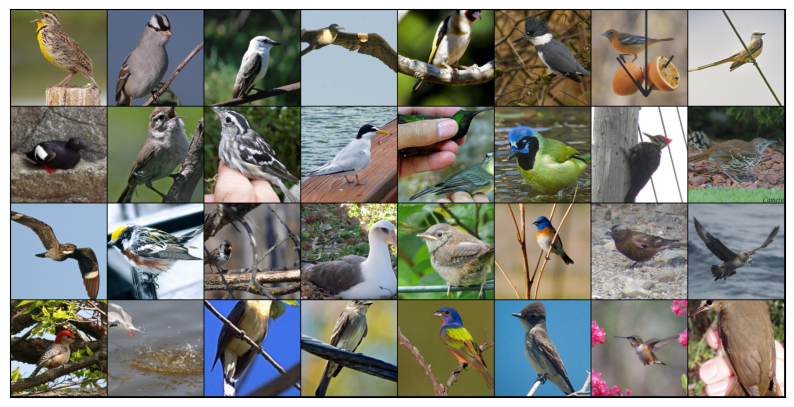

In [18]:
low_den_grid = make_grid(low_den_samples)
show(low_den_grid)

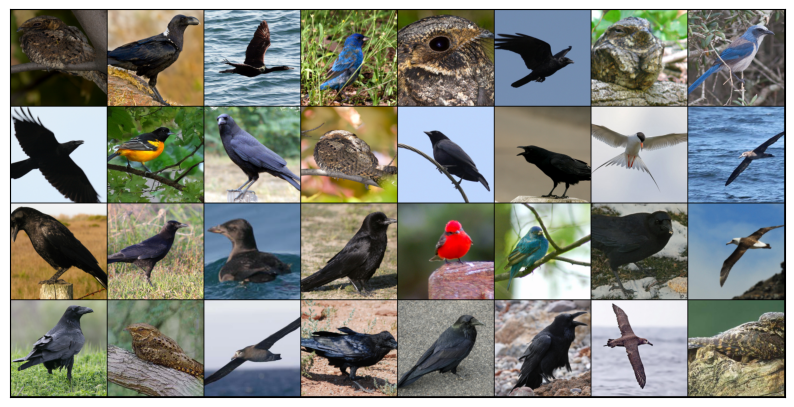

In [19]:
high_den_grid = make_grid(high_den_samples)
show(high_den_grid)

## 같은 label을 갖지만 region의 density 정도가 다른 경우 비교

(array([11.,  6.,  8.,  9.,  5.,  8.,  6., 11., 10., 10., 10.,  9.,  8.,
         8.,  8.,  8., 11.,  7.,  6.,  6.,  7.,  8., 11.,  4.,  7., 10.,
        11., 10.,  9.,  9.,  9., 12., 10., 12., 17., 12.,  9.,  9., 10.,
        11., 13., 10.,  8., 11.,  6.,  6.,  6.,  8.,  7., 12.,  6., 10.,
        10.,  9.,  5., 16.,  8.,  8., 10.,  6.,  5., 13.,  9.,  7.,  7.,
        12., 10.,  6., 17.,  7.,  8.,  8., 12., 11., 12.,  7., 14.,  3.,
         9., 15., 11.,  8., 10.,  8., 10., 10.,  5.,  9.,  9., 14., 15.,
        12.,  9.,  5., 12.,  7., 10., 13., 10.,  8., 11.,  9.,  6.,  3.,
        11.,  7., 10.,  6., 11., 11., 12., 11., 11.,  7., 13.,  8., 13.,
         8.,  6.,  7.,  7.,  9.,  4.,  7., 13.,  8.,  8.,  8., 10., 11.,
        13., 13., 10.,  6.,  8., 13.,  7., 11.,  8., 15.,  9.,  6.,  8.,
         9.,  9., 12.,  6.,  1., 11.,  7.,  7.,  8.,  7.,  6., 10.,  9.,
         9.,  6.,  6.,  4.,  8.,  6.,  7.,  9.,  9.,  7.,  8.,  9.,  9.,
         5.,  3.,  5., 11., 10.,  9.,  9.,  8.,  9.

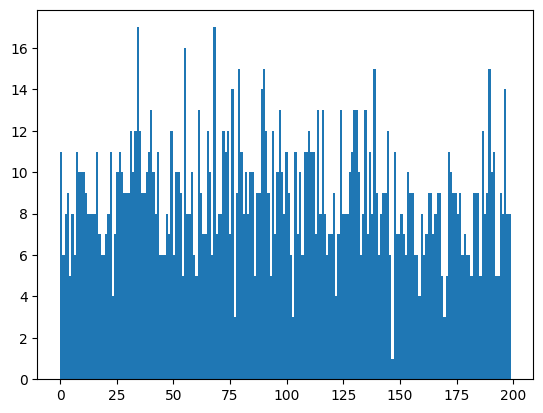

In [20]:
plt.hist(q_y_total, bins=200)

In [21]:
q_label = 1
q_label_samples = torch.where(q_y_total == q_label)[0].tolist()
for i in q_label_samples:
    print(f'{i}-th:       {q_density[i]}')

167-th:       39730
315-th:       0
354-th:       95235
933-th:       0
1556-th:       0
1623-th:       28124


label: 1, predictions: 64, 1


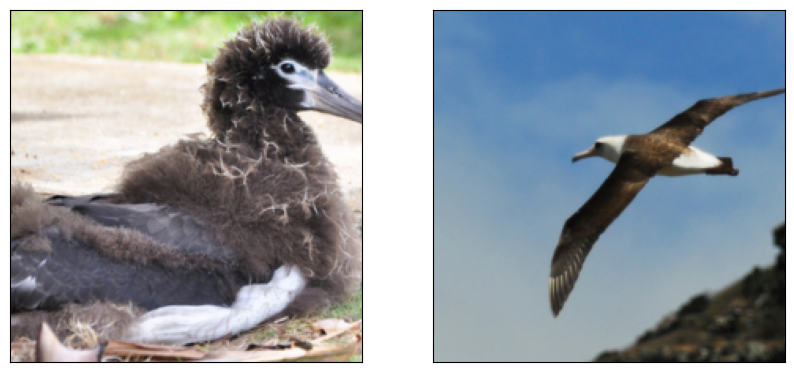

In [22]:
show_smaller([unorm(q_x_total[1556]), unorm(q_x_total[354])]) #315 -> config 기준으로는 dense region
print(f'label: {q_label}, predictions: {q_preds_total[1556]}, {q_preds_total[354]}')

In [23]:
q_label = 2
q_label_samples = torch.where(q_y_total == q_label)[0].tolist()
for i in q_label_samples:
    print(f'{i}-th:       {q_density[i]}')

80-th:       65767
288-th:       74891
342-th:       0
444-th:       0
554-th:       0
744-th:       91184
753-th:       0
976-th:       59017


label: 2, predictions: 2, 0


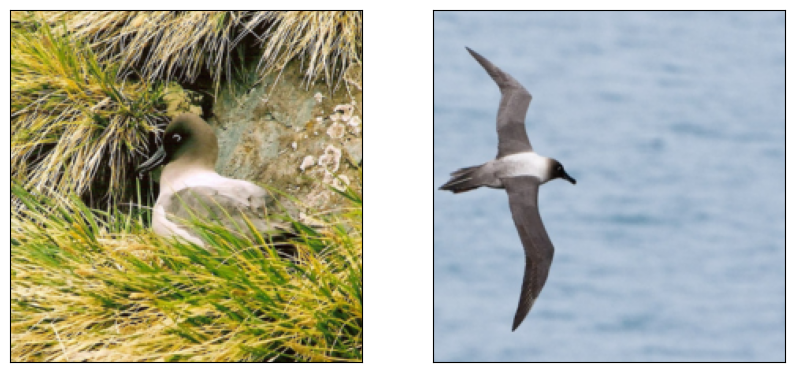

In [24]:
show_smaller([unorm(q_x_total[444]), unorm(q_x_total[744])])
print(f'label: {q_label}, predictions: {q_preds_total[444]}, {q_preds_total[744]}')

In [25]:
q_label = 145
q_label_samples = torch.where(q_y_total == q_label)[0].tolist()
for i in q_label_samples:
    print(f'{i}-th:       {q_density[i]}')

105-th:       21737
178-th:       26008
517-th:       50472
545-th:       42543
705-th:       0
923-th:       94173
926-th:       27648
950-th:       0
1389-th:       24115
1555-th:       40804
1736-th:       0
1768-th:       0


label: 145, predictions: 145, 145


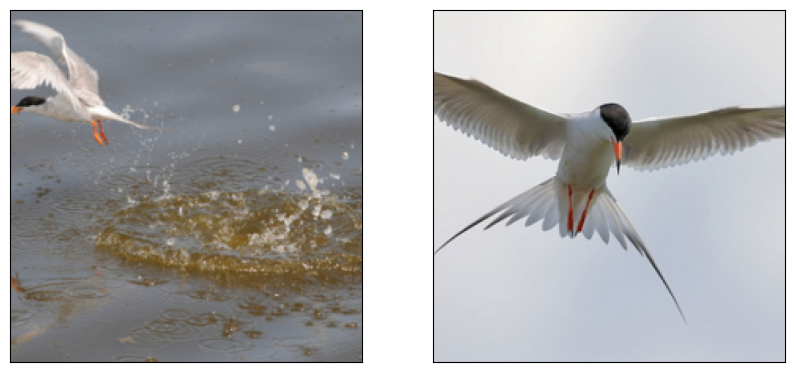

In [26]:
show_smaller([unorm(q_x_total[950]), unorm(q_x_total[923])])
print(f'label: {q_label}, predictions: {q_preds_total[950]}, {q_preds_total[923]}')

In [27]:
q_label = 197
q_label_samples = torch.where(q_y_total == q_label)[0].tolist()
for i in q_label_samples:
    print(f'{i}-th:       {q_density[i]}')

5-th:       0
304-th:       28911
629-th:       0
655-th:       0
925-th:       77210
1019-th:       0
1050-th:       0
1317-th:       73024
1460-th:       37500
1474-th:       25306
1475-th:       75748
1534-th:       46374
1608-th:       0
1644-th:       40182


label: 197, predictions: 195, 197, 197, 197


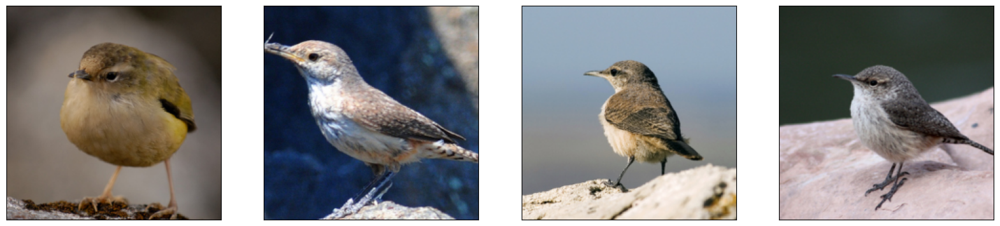

In [28]:
show_smaller([unorm(q_x_total[5]), unorm(q_x_total[655]), unorm(q_x_total[925]), unorm(q_x_total[1317])]) # 948: wrong prediction
print(f'label: {q_label}, predictions: {q_preds_total[5]}, {q_preds_total[655]}, {q_preds_total[925]}, {q_preds_total[1317]}')

## 같은 prediction을 갖지만 region의 density 정도가 다른 경우 비교

(array([13.,  5.,  8.,  9.,  3.,  6.,  7., 11., 11., 10.,  8.,  8.,  7.,
         9.,  9.,  8., 12.,  7.,  6.,  7.,  9., 10.,  9.,  7.,  6., 10.,
         7., 10., 10., 14.,  7., 11., 13., 13., 18., 13.,  4.,  9., 10.,
         6., 11., 10.,  8., 11.,  6.,  9.,  7.,  8.,  6., 11.,  7., 10.,
        11.,  8.,  5., 17.,  8.,  7.,  7., 13.,  6., 12., 12.,  4.,  9.,
        12., 11.,  7., 14.,  8.,  5., 12.,  9., 13., 12.,  9., 14.,  2.,
        11., 14., 11.,  8., 10.,  4., 10.,  9.,  5.,  9.,  8., 13., 17.,
        12.,  9.,  7., 12.,  5., 10., 13.,  9.,  7., 11., 10., 11.,  4.,
         9.,  6., 12.,  4., 11., 11., 11., 11.,  8.,  5., 14.,  6., 11.,
        10.,  6.,  7.,  7., 10.,  6.,  7., 15.,  6.,  9.,  8., 11., 10.,
        12., 12.,  8.,  6.,  8., 12.,  8., 11.,  8., 15., 11.,  6.,  6.,
         8., 10., 12.,  6.,  1., 11.,  5.,  7.,  7.,  6.,  6., 11., 11.,
        10.,  5.,  6.,  4.,  7.,  6.,  8.,  9.,  8.,  8.,  7.,  9.,  8.,
         3.,  3.,  7., 15., 11.,  7.,  8.,  9.,  9.

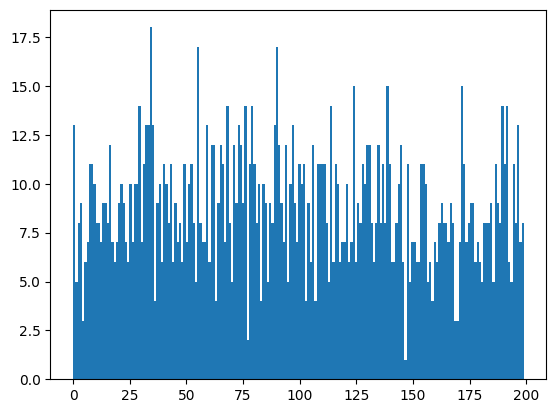

In [29]:
plt.hist(q_preds_total.cpu().detach(), bins=200)

In [30]:
q_pred = 16
q_pred_samples = torch.where(q_preds_total == q_pred)[0].tolist()
for i in q_pred_samples:
    print(f'{i}-th:       {q_density[i]}')

52-th:       89738
146-th:       87028
160-th:       72851
164-th:       78450
351-th:       77985
424-th:       72779
615-th:       82107
900-th:       87353
1144-th:       0
1394-th:       78512
1482-th:       75899
1711-th:       0


label: 96, 16, predictions: 16


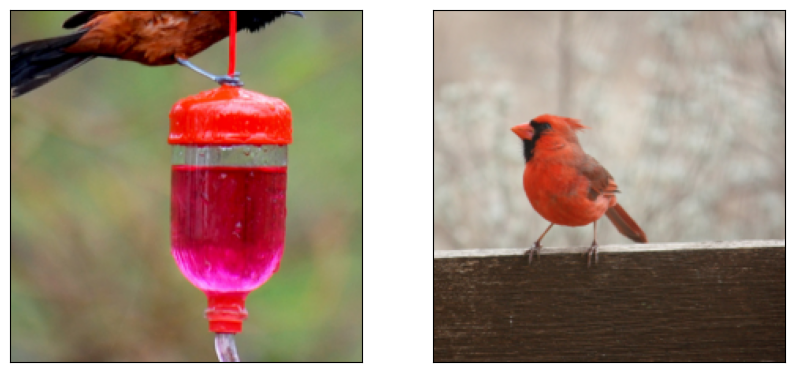

In [31]:
show_smaller([unorm(q_x_total[1144]), unorm(q_x_total[52])])
print(f'label: {q_y_total[1144]}, {q_y_total[52]}, predictions: {q_pred}')

In [32]:
q_pred = 193
q_pred_samples = torch.where(q_preds_total == q_pred)[0].tolist()
for i in q_pred_samples:
    print(f'{i}-th:       {q_density[i]}')

238-th:       0
610-th:       0
639-th:       0
739-th:       75044
829-th:       76558
1355-th:       53965


label: 193, 193, 193, 193, predictions: 193


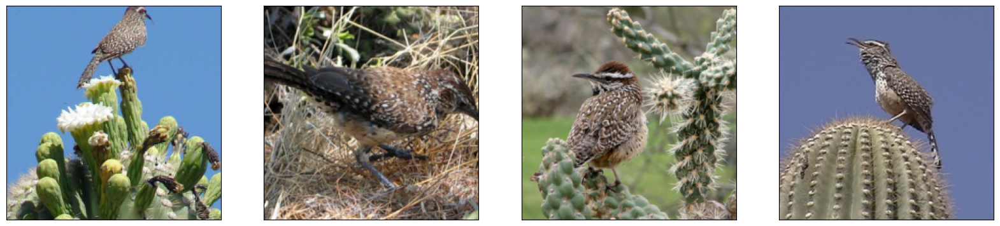

In [33]:
show_smaller([unorm(q_x_total[238]), unorm(q_x_total[610]), unorm(q_x_total[829]), unorm(q_x_total[739])])
print(f'label: {q_y_total[238]}, {q_y_total[610]}, {q_y_total[829]}, {q_y_total[739]}, predictions: {q_pred}')

## Region 관찰 (query 이미지를 중심으로)

### High-density region

In [34]:
high_density_idx[:3]

[1322, 175, 1200]

label: [104, 104, 21, 104, 104, 21, 21, 104, 21, 104, 21, 104, 104, 104, 21, 21, 21, 21, 21, 91, 104, 21, 21, 104, 104, 104, 21, 104, 21, 104, 21, 104]
preds: [21, 104, 21, 104, 104, 104, 21, 104, 21, 104, 21, 104, 104, 104, 21, 21, 21, 21, 21, 104, 104, 21, 21, 104, 104, 104, 21, 104, 21, 104, 21, 21]


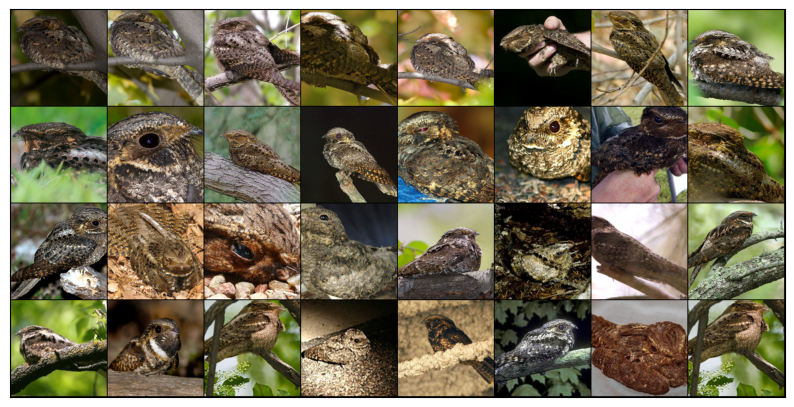

In [36]:
k = 31
h_idx = 1322
local_nearest_idx, local_nearest_dist = get_local_nearest_euc_and_idx(q_ac_total[h_idx], ac_total, th=args.q_th)
sorted_idx = np.argsort(local_nearest_dist) # 인덱스의 인덱스 / 쿼리와 가까운 순서대로
img_list = [unorm(q_x_total[h_idx])]
label_list = [q_y_total[h_idx].item()]
preds_list = [q_preds_total[h_idx].item()]
for i in range(k):
    img_list.append(unorm(x_total[local_nearest_idx[sorted_idx[i]]]))
    label_list.append(y_total[local_nearest_idx[sorted_idx[i]]].item())
    preds_list.append(preds_total[local_nearest_idx[sorted_idx[i]]].item())
grid = make_grid(img_list)
show(grid)
print(f'label: {label_list}')
print(f'preds: {preds_list}')

label: [107, 107, 106, 106, 28, 107, 106, 107, 106, 28, 106, 28, 106, 29, 28, 28, 29, 28, 28, 107, 28, 106, 28, 106, 106, 106, 29, 107, 28, 29, 28, 28]
preds: [106, 107, 28, 106, 28, 106, 28, 106, 106, 28, 106, 28, 106, 29, 28, 28, 29, 28, 106, 107, 28, 106, 28, 28, 106, 106, 28, 107, 28, 29, 28, 28]


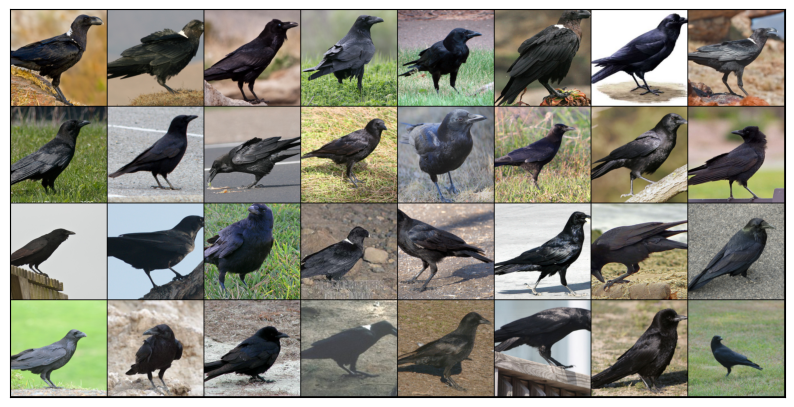

In [38]:
k = 31
h_idx = 175
local_nearest_idx, local_nearest_dist = get_local_nearest_euc_and_idx(q_ac_total[h_idx], ac_total, th=args.q_th)
sorted_idx = np.argsort(local_nearest_dist) # 인덱스의 인덱스 / 쿼리와 가까운 순서대로
img_list = [unorm(q_x_total[h_idx])]
label_list = [q_y_total[h_idx].item()]
preds_list = [q_preds_total[h_idx].item()]
for i in range(k):
    img_list.append(unorm(x_total[local_nearest_idx[sorted_idx[i]]]))
    label_list.append(y_total[local_nearest_idx[sorted_idx[i]]].item())
    preds_list.append(preds_total[local_nearest_idx[sorted_idx[i]]].item())
grid = make_grid(img_list)
show(grid)
print(f'label: {label_list}')
print(f'preds: {preds_list}')

label: [22, 70, 22, 71, 24, 0, 24, 0, 0, 22, 85, 71, 24, 0, 0, 0, 24, 24, 0, 24, 24, 0, 0, 70, 89, 22, 71, 1, 44, 0, 24, 0]
preds: [0, 71, 24, 0, 24, 0, 24, 0, 0, 22, 85, 71, 24, 0, 0, 0, 24, 24, 0, 24, 24, 0, 0, 71, 89, 22, 71, 1, 44, 0, 24, 0]


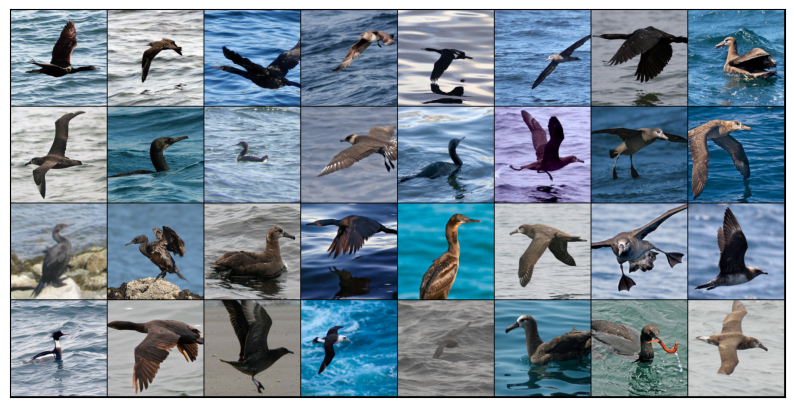

In [40]:
k = 31
h_idx = 1200
local_nearest_idx, local_nearest_dist = get_local_nearest_euc_and_idx(q_ac_total[h_idx], ac_total, th=args.q_th)
sorted_idx = np.argsort(local_nearest_dist) # 인덱스의 인덱스 / 쿼리와 가까운 순서대로
img_list = [unorm(q_x_total[h_idx])]
label_list = [q_y_total[h_idx].item()]
preds_list = [q_preds_total[h_idx].item()]
for i in range(k):
    img_list.append(unorm(x_total[local_nearest_idx[sorted_idx[i]]]))
    label_list.append(y_total[local_nearest_idx[sorted_idx[i]]].item())
    preds_list.append(preds_total[local_nearest_idx[sorted_idx[i]]].item())
grid = make_grid(img_list)
show(grid)
print(f'label: {label_list}')
print(f'preds: {preds_list}')

### Low-density region

In [41]:
low_density_idx[:3]

[0, 890, 891]

In [42]:
q_density[0]

0

### Mid-density region

In [43]:
np.where((40000<np.array(q_density)) & (np.array(q_density)<45000))[0]

array([   9,   24,   38,   40,   43,   61,   64,   72,   92,   94,  156,
        194,  260,  292,  322,  324,  380,  409,  531,  545,  578,  579,
        602,  611,  653,  716,  719,  733,  767,  786,  791,  808,  818,
        826,  879,  899,  937,  955,  987,  989, 1011, 1047, 1061, 1097,
       1141, 1242, 1255, 1262, 1272, 1320, 1347, 1380, 1381, 1404, 1405,
       1483, 1488, 1498, 1513, 1522, 1541, 1542, 1546, 1555, 1573, 1621,
       1625, 1628, 1644, 1655, 1670, 1707, 1760])

label: [117, 117, 117, 117, 117, 117, 117, 117, 129, 136, 117, 117, 117, 129, 129, 117, 117, 129, 117, 117, 115, 117, 129, 117, 136, 136, 115, 55, 129, 84, 136, 115]
preds: [117, 117, 117, 117, 117, 117, 117, 117, 129, 136, 117, 117, 117, 129, 129, 117, 117, 129, 117, 117, 115, 117, 129, 117, 136, 136, 115, 55, 129, 84, 136, 115]


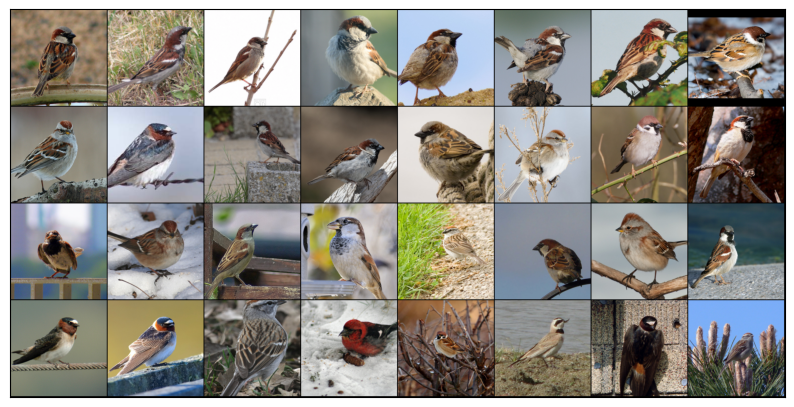

In [50]:
m_idx = 24
local_nearest_idx, local_nearest_dist = get_local_nearest_euc_and_idx(q_ac_total[m_idx], ac_total, th=args.q_th)
k = 31
sorted_idx = np.argsort(local_nearest_dist) # 인덱스의 인덱스 / 쿼리와 가까운 순서대로
img_list = [unorm(q_x_total[m_idx])]
label_list = [q_y_total[m_idx].item()]
preds_list = [q_preds_total[m_idx].item()]
for i in range(k):
    img_list.append(unorm(x_total[local_nearest_idx[sorted_idx[i]]]))
    label_list.append(y_total[local_nearest_idx[sorted_idx[i]]].item())
    preds_list.append(preds_total[local_nearest_idx[sorted_idx[i]]].item())
grid = make_grid(img_list)
show(grid)
print(f'label: {label_list}')
print(f'preds: {preds_list}')

label: [114, 149, 114, 128, 114, 116, 114, 116, 114, 130, 114, 114, 114, 114, 114, 130, 114, 114, 114, 114, 130, 116, 114, 130, 116, 130, 130, 130, 112, 114, 114, 115]
preds: [114, 130, 114, 130, 114, 116, 114, 116, 114, 130, 114, 114, 114, 114, 130, 130, 114, 114, 114, 114, 130, 116, 114, 130, 116, 130, 130, 130, 130, 114, 114, 114]


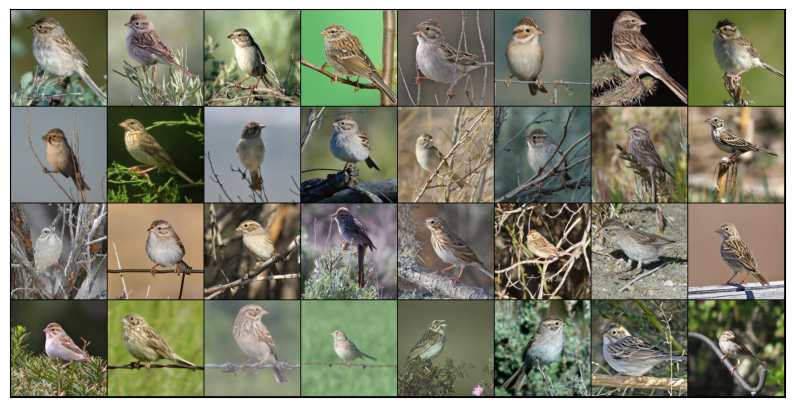

In [51]:
m_idx = 767
local_nearest_idx, local_nearest_dist = get_local_nearest_euc_and_idx(q_ac_total[m_idx], ac_total, th=args.q_th)
k = 31
sorted_idx = np.argsort(local_nearest_dist) # 인덱스의 인덱스 / 쿼리와 가까운 순서대로
img_list = [unorm(q_x_total[m_idx])]
label_list = [q_y_total[m_idx].item()]
preds_list = [q_preds_total[m_idx].item()]
for i in range(k):
    img_list.append(unorm(x_total[local_nearest_idx[sorted_idx[i]]]))
    label_list.append(y_total[local_nearest_idx[sorted_idx[i]]].item())
    preds_list.append(preds_total[local_nearest_idx[sorted_idx[i]]].item())
grid = make_grid(img_list)
show(grid)
print(f'label: {label_list}')
print(f'preds: {preds_list}')

label: [190, 190, 190, 190, 190, 190, 190, 190, 16, 16, 190, 190, 190, 55, 110, 55, 190, 92, 190, 92, 77, 16, 78, 190, 190, 16, 190, 16, 35, 68, 16, 111]
preds: [190, 190, 190, 190, 190, 190, 190, 190, 16, 16, 190, 190, 190, 55, 110, 55, 190, 92, 190, 92, 110, 16, 78, 190, 190, 16, 190, 16, 35, 68, 16, 111]


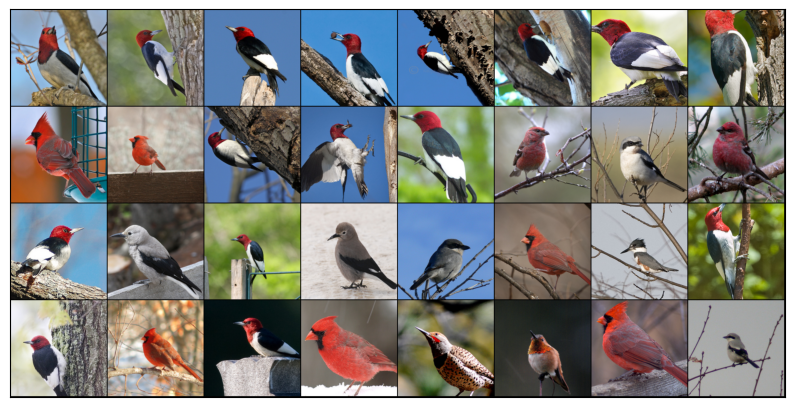

In [53]:
m_idx = 1573
local_nearest_idx, local_nearest_dist = get_local_nearest_euc_and_idx(q_ac_total[m_idx], ac_total, th=args.q_th)
k = 31 #len(local_nearest_idx)
sorted_idx = np.argsort(local_nearest_dist) # 인덱스의 인덱스 / 쿼리와 가까운 순서대로
img_list = [unorm(q_x_total[m_idx])]
label_list = [q_y_total[m_idx].item()]
preds_list = [q_preds_total[m_idx].item()]
for i in range(k):
    img_list.append(unorm(x_total[local_nearest_idx[sorted_idx[i]]]))
    label_list.append(y_total[local_nearest_idx[sorted_idx[i]]].item())
    preds_list.append(preds_total[local_nearest_idx[sorted_idx[i]]].item())
grid = make_grid(img_list)
show(grid)
print(f'label: {label_list}')
print(f'preds: {preds_list}')

# Accuracy와의 관계

In [65]:
for i in range(0,100000,10000):
    q_idx_range = np.where((i<=np.array(q_density)) & (np.array(q_density)<(i+10000)))[0]
    acc = np.sum(np.array(q_eq_total)[q_idx_range])/len(q_idx_range)
    print(f'{i}~{i+10000}:        {acc}')
    print(f'개수:                  {len(q_idx_range)}')

0~10000:        0.8188622754491018
개수:                  668
10000~20000:        1.0
개수:                  2
20000~30000:        0.91005291005291
개수:                  189
30000~40000:        0.8958333333333334
개수:                  96
40000~50000:        0.9069767441860465
개수:                  129
50000~60000:        0.8712121212121212
개수:                  132
60000~70000:        0.9230769230769231
개수:                  143
70000~80000:        0.9244186046511628
개수:                  172
80000~90000:        0.8757396449704142
개수:                  169
90000~100000:        0.7681159420289855
개수:                  69
